This notebook will investigate on the use of Real-time Voice Cloning's Pre-trained Speaker Encoder.

In [32]:
import torch
import struct
import librosa
import webrtcvad
import hydra
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import warnings
from pathlib import Path
from typing import Optional, Union
from scipy.ndimage.morphology import binary_dilation
from IPython.display import Audio, display
from scipy.interpolate import interp1d
from sklearn.metrics import roc_curve
from torch.nn.utils import clip_grad_norm_
from scipy.optimize import brentq
from torch import nn
from hydra import compose, initialize
from sklearn.manifold import TSNE
from tqdm import tqdm
from src.datamodule.audio_datamodule import AudioDataModule

warnings.filterwarnings('ignore')

# Loading Real-time Voice cloning's encoder (RTVC)

In [33]:
## Model parameters
model_hidden_size = 256
model_embedding_size = 256
model_num_layers = 3


## Training parameters
learning_rate_init = 1e-4
speakers_per_batch = 64
utterances_per_speaker = 10

In [34]:
int16_max = (2 ** 15) - 1

## Mel-filterbank
mel_window_length = 25  # In milliseconds
mel_window_step = 10    # In milliseconds
mel_n_channels = 40


## Audio
sampling_rate = 16000
# Number of spectrogram frames in a partial utterance
partials_n_frames = 160     # 1600 ms
# Number of spectrogram frames at inference
inference_n_frames = 80     #  800 ms


## Voice Activation Detection
# Window size of the VAD. Must be either 10, 20 or 30 milliseconds.
# This sets the granularity of the VAD. Should not need to be changed.
vad_window_length = 30  # In milliseconds
# Number of frames to average together when performing the moving average smoothing.
# The larger this value, the larger the VAD variations must be to not get smoothed out.
vad_moving_average_width = 8
# Maximum number of consecutive silent frames a segment can have.
vad_max_silence_length = 6


## Audio volume normalization
audio_norm_target_dBFS = -30

In [35]:
class SpeakerEncoder(nn.Module):
    def __init__(self, device, loss_device):
        super().__init__()
        self.loss_device = loss_device

        # Network defition
        self.lstm = nn.LSTM(input_size=mel_n_channels,
                            hidden_size=model_hidden_size,
                            num_layers=model_num_layers,
                            batch_first=True).to(device)
        self.linear = nn.Linear(in_features=model_hidden_size,
                                out_features=model_embedding_size).to(device)
        self.relu = torch.nn.ReLU().to(device)

        # Cosine similarity scaling (with fixed initial parameter values)
        self.similarity_weight = nn.Parameter(torch.tensor([10.])).to(loss_device)
        self.similarity_bias = nn.Parameter(torch.tensor([-5.])).to(loss_device)

        # Loss
        self.loss_fn = nn.CrossEntropyLoss().to(loss_device)

    def do_gradient_ops(self):
        # Gradient scale
        self.similarity_weight.grad *= 0.01
        self.similarity_bias.grad *= 0.01

        # Gradient clipping
        clip_grad_norm_(self.parameters(), 3, norm_type=2)

    def forward(self, utterances, hidden_init=None):
        """
        Computes the embeddings of a batch of utterance spectrograms.

        :param utterances: batch of mel-scale filterbanks of same duration as a tensor of shape
        (batch_size, n_frames, n_channels)
        :param hidden_init: initial hidden state of the LSTM as a tensor of shape (num_layers,
        batch_size, hidden_size). Will default to a tensor of zeros if None.
        :return: the embeddings as a tensor of shape (batch_size, embedding_size)
        """
        # Pass the input through the LSTM layers and retrieve all outputs, the final hidden state
        # and the final cell state.
        out, (hidden, cell) = self.lstm(utterances, hidden_init)

        # We take only the hidden state of the last layer
        embeds_raw = self.relu(self.linear(hidden[-1]))

        # L2-normalize it
        embeds = embeds_raw / (torch.norm(embeds_raw, dim=1, keepdim=True) + 1e-5)

        return embeds

    def similarity_matrix(self, embeds):
        """
        Computes the similarity matrix according the section 2.1 of GE2E.
        :param embeds: the embeddings as a tensor of shape (speakers_per_batch,
        utterances_per_speaker, embedding_size)
        :return: the similarity matrix as a tensor of shape (speakers_per_batch,
        utterances_per_speaker, speakers_per_batch)
        """
        speakers_per_batch, utterances_per_speaker = embeds.shape[:2]

        # Inclusive centroids (1 per speaker). Cloning is needed for reverse differentiation
        centroids_incl = torch.mean(embeds, dim=1, keepdim=True)
        centroids_incl = centroids_incl.clone() / (torch.norm(centroids_incl, dim=2, keepdim=True) + 1e-5)

        # Exclusive centroids (1 per utterance)
        centroids_excl = (torch.sum(embeds, dim=1, keepdim=True) - embeds)
        centroids_excl /= (utterances_per_speaker - 1)
        centroids_excl = centroids_excl.clone() / (torch.norm(centroids_excl, dim=2, keepdim=True) + 1e-5)

        # Similarity matrix. The cosine similarity of already 2-normed vectors is simply the dot
        # product of these vectors (which is just an element-wise multiplication reduced by a sum).
        # We vectorize the computation for efficiency.
        sim_matrix = torch.zeros(speakers_per_batch, utterances_per_speaker,
                                 speakers_per_batch).to(self.loss_device)
        mask_matrix = 1 - np.eye(speakers_per_batch, dtype=np.int)
        for j in range(speakers_per_batch):
            mask = np.where(mask_matrix[j])[0]
            sim_matrix[mask, :, j] = (embeds[mask] * centroids_incl[j]).sum(dim=2)
            sim_matrix[j, :, j] = (embeds[j] * centroids_excl[j]).sum(dim=1)

        ## Even more vectorized version (slower maybe because of transpose)
        # sim_matrix2 = torch.zeros(speakers_per_batch, speakers_per_batch, utterances_per_speaker
        #                           ).to(self.loss_device)
        # eye = np.eye(speakers_per_batch, dtype=np.int)
        # mask = np.where(1 - eye)
        # sim_matrix2[mask] = (embeds[mask[0]] * centroids_incl[mask[1]]).sum(dim=2)
        # mask = np.where(eye)
        # sim_matrix2[mask] = (embeds * centroids_excl).sum(dim=2)
        # sim_matrix2 = sim_matrix2.transpose(1, 2)

        sim_matrix = sim_matrix * self.similarity_weight + self.similarity_bias
        return sim_matrix

    def loss(self, embeds):
        """
        Computes the softmax loss according the section 2.1 of GE2E.

        :param embeds: the embeddings as a tensor of shape (speakers_per_batch,
        utterances_per_speaker, embedding_size)
        :return: the loss and the EER for this batch of embeddings.
        """
        speakers_per_batch, utterances_per_speaker = embeds.shape[:2]

        # Loss
        sim_matrix = self.similarity_matrix(embeds)
        sim_matrix = sim_matrix.reshape((speakers_per_batch * utterances_per_speaker,
                                         speakers_per_batch))
        ground_truth = np.repeat(np.arange(speakers_per_batch), utterances_per_speaker)
        target = torch.from_numpy(ground_truth).long().to(self.loss_device)
        loss = self.loss_fn(sim_matrix, target)

        # EER (not backpropagated)
        with torch.no_grad():
            inv_argmax = lambda i: np.eye(1, speakers_per_batch, i, dtype=np.int)[0]
            labels = np.array([inv_argmax(i) for i in ground_truth])
            preds = sim_matrix.detach().cpu().numpy()

            # Snippet from https://yangcha.github.io/EER-ROC/
            fpr, tpr, thresholds = roc_curve(labels.flatten(), preds.flatten())
            eer = brentq(lambda x: 1. - x - interp1d(fpr, tpr)(x), 0., 1.)

        return loss,

In [36]:
# base encoder part of: https://github.com/CorentinJ/Real-Time-Voice-Cloning
rtvc_path = '../models/pre-trained/rt_voice_cloning_encoder.pt'
device = torch.device('cpu')
rtvc_model = SpeakerEncoder(device, torch.device("cpu"))
checkpoint = torch.load(rtvc_path, device)
rtvc_model.load_state_dict(checkpoint["model_state"])
rtvc_model.eval()

SpeakerEncoder(
  (lstm): LSTM(40, 256, num_layers=3, batch_first=True)
  (linear): Linear(in_features=256, out_features=256, bias=True)
  (relu): ReLU()
  (loss_fn): CrossEntropyLoss()
)

# RTVC Preprocesses

In [37]:
def normalize_volume(wav, target_dBFS, increase_only=False, decrease_only=False):
    if increase_only and decrease_only:
        raise ValueError("Both increase only and decrease only are set")
    dBFS_change = target_dBFS - 10 * np.log10(np.mean(wav ** 2))
    if (dBFS_change < 0 and increase_only) or (dBFS_change > 0 and decrease_only):
        return wav
    return wav * (10 ** (dBFS_change / 20))

In [38]:
def trim_long_silences(wav):
    """
    Ensures that segments without voice in the waveform remain no longer than a
    threshold determined by the VAD parameters in params.py.
    :param wav: the raw waveform as a numpy array of floats
    :return: the same waveform with silences trimmed away (length <= original wav length)
    """
    # Compute the voice detection window size
    samples_per_window = (vad_window_length * sampling_rate) // 1000

    # Trim the end of the audio to have a multiple of the window size
    wav = wav[:len(wav) - (len(wav) % samples_per_window)]

    # Convert the float waveform to 16-bit mono PCM
    pcm_wave = struct.pack("%dh" % len(wav), *(np.round(wav * int16_max)).astype(np.int16))

    # Perform voice activation detection
    voice_flags = []
    vad = webrtcvad.Vad(mode=3)
    for window_start in range(0, len(wav), samples_per_window):
        window_end = window_start + samples_per_window
        voice_flags.append(vad.is_speech(pcm_wave[window_start * 2:window_end * 2],
                                         sample_rate=sampling_rate))
    voice_flags = np.array(voice_flags)

    # Smooth the voice detection with a moving average
    def moving_average(array, width):
        array_padded = np.concatenate((np.zeros((width - 1) // 2), array, np.zeros(width // 2)))
        ret = np.cumsum(array_padded, dtype=float)
        ret[width:] = ret[width:] - ret[:-width]
        return ret[width - 1:] / width

    audio_mask = moving_average(voice_flags, vad_moving_average_width)
    audio_mask = np.round(audio_mask).astype(bool)

    # Dilate the voiced regions
    audio_mask = binary_dilation(audio_mask, np.ones(vad_max_silence_length + 1))
    audio_mask = np.repeat(audio_mask, samples_per_window)

    return wav[audio_mask == True]

In [39]:
def preprocess_wav(fpath_or_wav: Union[str, Path, np.ndarray],
                   source_sr: Optional[int] = None,
                   normalize: Optional[bool] = True,
                   trim_silence: Optional[bool] = True):
    """
    Applies the preprocessing operations used in training the Speaker Encoder to a waveform
    either on disk or in memory. The waveform will be resampled to match the data hyperparameters.
    :param fpath_or_wav: either a filepath to an audio file (many extensions are supported, not
    just .wav), either the waveform as a numpy array of floats.
    :param source_sr: if passing an audio waveform, the sampling rate of the waveform before
    preprocessing. After preprocessing, the waveform's sampling rate will match the data
    hyperparameters. If passing a filepath, the sampling rate will be automatically detected and
    this argument will be ignored.
    """
    # Load the wav from disk if needed
    if isinstance(fpath_or_wav, str) or isinstance(fpath_or_wav, Path):
        wav, source_sr = librosa.load(str(fpath_or_wav), sr=None)
    else:
        wav = fpath_or_wav

    # Resample the wav if needed
    if source_sr is not None and source_sr != sampling_rate:
        wav = librosa.resample(wav, orig_sr=source_sr, target_sr=sampling_rate)

    # Apply the preprocessing: normalize volume and shorten long silences
    if normalize:
        wav = normalize_volume(wav, audio_norm_target_dBFS, increase_only=True)
    if webrtcvad and trim_silence:
        wav = trim_long_silences(wav)

    return wav

In [40]:
def wav_to_mel_spectrogram(wav):
    """
    Derives a mel spectrogram ready to be used by the encoder from a preprocessed audio waveform.
    Note: this not a log-mel spectrogram.
    """
    frames = librosa.feature.melspectrogram(
        y=wav,
        sr=sampling_rate,
        n_fft=int(sampling_rate * mel_window_length / 1000),
        hop_length=int(sampling_rate * mel_window_step / 1000),
        n_mels=mel_n_channels
    )
    return frames.astype(np.float32).T

In [41]:
def embed_frames_batch(frames_batch):
    """
    Computes embeddings for a batch of mel spectrogram.
    :param frames_batch: a batch mel of spectrogram as a numpy array of float32 of shape
    (batch_size, n_frames, n_channels)
    :return: the embeddings as a numpy array of float32 of shape (batch_size, model_embedding_size)
    """
    if rtvc_model is None:
        raise Exception("Model was not loaded. Call load_model() before inference.")

    frames = torch.from_numpy(frames_batch).to('cpu')
    embed = rtvc_model.forward(frames).detach().cpu().numpy()
    return embed

In [42]:
def get_embedding(wave_path ):
    wav = preprocess_wav(wave_path)
    frames = wav_to_mel_spectrogram(wav)
    embed = embed_frames_batch(frames[None, ...])[0]
    return embed

In [43]:
def cosine_similarity(a, b):
    return (a @ b.T) / (np.linalg.norm(a)*np.linalg.norm(b))

# Load our audio

In [44]:
sound_path_KENN_1 = '../data/raw/nus-48e/KENN/sing/12.wav'
sound_path_KENN_2 = '../data/raw/nus-48e/KENN/sing/17.wav'
wav_KENN_1 = preprocess_wav(sound_path_KENN_1)
wav_KENN_2 = preprocess_wav(sound_path_KENN_2)
embed_KENN_1 = get_embedding(wav_KENN_1)
embed_KENN_2 = get_embedding(wav_KENN_2)

In [45]:
np.shape(embed_KENN_1)

(256,)

In [46]:
display(Audio(wav_KENN_1, rate=sampling_rate))

In [47]:
display(Audio(wav_KENN_2, rate=sampling_rate))

# Cosine Similarity with the same speaker KENN

In [48]:
cosine_similarity(embed_KENN_1, embed_KENN_2)

0.6913287

In [49]:
sound_path_ADIZ_1 = '../data/raw/nus-48e/ADIZ/sing/01.wav'
sound_path_ADIZ_2 = '../data/raw/nus-48e/ADIZ/sing/18.wav'
wav_ADIZ_1 = preprocess_wav(sound_path_ADIZ_1)
wav_ADIZ_2 = preprocess_wav(sound_path_ADIZ_2)
embed_ADIZ_1 = get_embedding(wav_ADIZ_1)
embed_ADIZ_2 = get_embedding(wav_ADIZ_2)

In [50]:
display(Audio(wav_ADIZ_1, rate=sampling_rate))

In [51]:
display(Audio(wav_ADIZ_2, rate=sampling_rate))

# Cosine Similarity with the same speaker ADIZ

In [52]:
cosine_similarity(embed_ADIZ_1, embed_ADIZ_2)

0.49501494

# Cosine Similarity between speaker ADIZ and KENN

In [53]:
cosine_similarity(embed_ADIZ_1, embed_KENN_2)

0.5012835

In [54]:
cosine_similarity(embed_KENN_1, embed_ADIZ_2)

0.4223178

## Comments

For Cosine similarity, the score values are between 0 and 1, where 0 is not similar, and 1 is virtually identical.

For this limited test, the usefulness of the pre-trained embeddings are not obvious.


# Plot a T-SNE to show how the embeddings can separate between speakers

In [55]:
# load hydra params
hydra.core.global_hydra.GlobalHydra.instance().clear()
initialize(config_path="../conf", job_name="test_app", version_base='1.1')
cfg = compose(config_name="config", overrides=['dataset.do_random_block=false'])

In [56]:
dm = AudioDataModule(data_dir=Path('../data/processed/nus'),
                              cfg=cfg,
                              batch_size=1,
                              do_aug_in_train=False,
                              do_aug_in_val=False,
                              do_aug_in_test=False)
dm.setup('fit')
dm_train = dm.train_dataloader()
dm_val = dm.val_dataloader()
dm.setup('test')
dm_test = dm.test_dataloader()

In [57]:
def generate_dataframe_of_embeddings(dataloader):
    speaker_names = []
    embeddings = []
    for batch in tqdm(dataloader):
        x, y, speaker, name = batch
        numpy_wav = speaker[0][0].detach().cpu().numpy() # select only 1 channel
        emb = get_embedding(numpy_wav)
        embeddings.append(emb)
        speaker_names.append(name[0])

    data = {'emb': embeddings, 'name': speaker_names}
    df = pd.DataFrame(data=data)
    return df

In [58]:
df_train = generate_dataframe_of_embeddings(dm_train)
df_val = generate_dataframe_of_embeddings(dm_val)
df_test = generate_dataframe_of_embeddings(dm_test)

df = pd.concat([df_train, df_val, df_test])

100%|██████████| 136/136 [00:06<00:00, 21.73it/s]


In [59]:
tsne = TSNE(n_components=2, verbose=1, perplexity=10, n_iter=4000)

In [60]:
embeddings = df['emb'].values
embeddings = np.stack(embeddings)
tsne_results = tsne.fit_transform(embeddings)
df['tsne-one'] = tsne_results[:,0]
df['tsne-two'] = tsne_results[:,1]

[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 1244 samples in 0.000s...
[t-SNE] Computed neighbors for 1244 samples in 0.021s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1244
[t-SNE] Computed conditional probabilities for sample 1244 / 1244
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 79.244675
[t-SNE] KL divergence after 4000 iterations: 0.030103


In [61]:
female_names = ['ADIZ', 'MCUR', 'MPOL', 'MPUR', 'NJAT', 'PMAR' ]
male_names = ['JLEE', 'JTAN', 'KENN', 'SAMF', 'VKOW', 'ZHIY' ]
df['gender'] = np.where( df['name'].isin(female_names) , 'F', 'M')

[Text(0.5, 1.0, 't-SNE of embeddings labelled by Gender')]

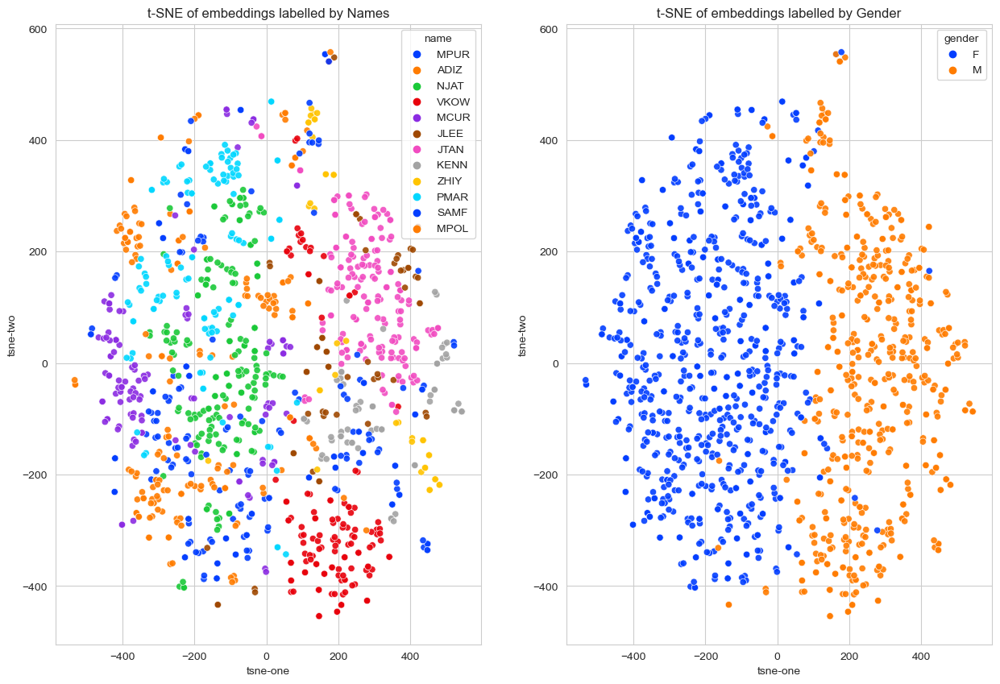

In [62]:
plt.figure(figsize=(15,10))
ax1 = plt.subplot(1, 2, 1)
sns.scatterplot(
    x="tsne-one", y="tsne-two",
    hue="name",
    palette=sns.color_palette("bright", len(df['name'].unique())),
    data=df,
    legend="full",
    alpha=0.9,
    ax=ax1
).set(title='t-SNE of embeddings labelled by Names')
ax2 = plt.subplot(1, 2, 2)
sns.scatterplot(
    x="tsne-one", y="tsne-two",
    hue="gender",
    palette=sns.color_palette("bright", len(df['gender'].unique())),
    data=df,
    legend="full",
    alpha=0.9,
    ax=ax2
).set(title='t-SNE of embeddings labelled by Gender')

# Comments
- Do note that each point is the embedding of a 1 sec crop of the person singing.
- We can clearly see the embedding is able to differentiate between male and female.
- The embedding within male or female voices are less obvious to separate, but we cannot read too much due to inherent t-SNE's stochastic algo.
- At least it gives us a clue that the embeddings are able to provide good gender info.
- Embedding vector size of each person is 256.